In [86]:
from pyreadr import read_r
import pickle
from pytorch_forecasting import TemporalFusionTransformer
import pandas as pd
import numpy as np
import matplotlib
import random

In [2]:
with open("/home/v18y97/mt_pop_forecast/test_study.pkl", "rb") as fin:
    study = pickle.load(fin)

print(study.best_trial.params)

{'gradient_clip_val': 0.126927486452408, 'hidden_size': 40, 'dropout': 0.19273805357529594, 'hidden_continuous_size': 16, 'attention_head_size': 2, 'learning_rate': 0.0070009165741873524}


In [3]:
best_model_path = "/data/lightning_logs/lightning_logs/version_3/checkpoints/epoch=49-step=2500.ckpt"

best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

/data/torch-env/lib/python3.11/site-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/data/torch-env/lib/python3.11/site-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


### Read and prepare data for prediction

In [4]:
data_path = r"/data/simon/"
#data_path = r"C:\Users\simon.sarcletti\OneDrive - FH JOANNEUM\FH Joanneum - DAT\XX_Masterarbeit\05_Empirical_work\01_data\02_work"

all_munip_pop = read_r(data_path + r"all_municipalities_population.RData")[
    "all_munip_pop"
]

all_munip_pop["municipality_code"] = all_munip_pop["municipality_code"].astype("int64")

static_data_path = r"/data/simon/"
#static_data_path = r"C:\Users\simon.sarcletti\OneDrive - FH JOANNEUM\FH Joanneum - DAT\XX_Masterarbeit\05_Empirical_work\01_data\01_original"

static_metadata = pd.read_csv(
    static_data_path + r"static_variables.csv",
    encoding="latin-1",
    sep=";",
    decimal=",",
)
merged_data = pd.merge(
    all_munip_pop,
    static_metadata,
    how="left",
    left_on="municipality_code",
    right_on="ID",
)

# create an index col
merged_data["index"] = (
    merged_data["municipality_code"].astype(str)
    + "_"
    + merged_data["sex"].round(0).astype(str)
    + "_"
    + merged_data["coarse_age_group"]
)
# remove unnecessary columns
merged_data = merged_data.drop(
    columns=[
        "Name",
        "ID",
        "municipality_code",
        "reg_code",
        "municipality",
        "sex",
        "population",
    ]
) # maybe remove "Jahresbruttobezug_2023" as well

merged_data = merged_data[merged_data["year"] >= 2004].copy()

# create a new column with first three digits of index
merged_data["reg_code"] = merged_data["index"].str[:3]

merged_data = merged_data.rename(
    columns={"smoothed_population": "population", "coarse_age_group": "age_group"}
)
merged_data["year"] = pd.to_numeric(merged_data["year"], downcast="integer")


In [5]:
merged_data.head()

,age_group,year,population,Urban-Rural-Typologie,klassifikation_palme95,OeV-Güteklassen,Bezirkshauptstadt,schulen_ue250,umkreis_schulen,haltestelle_IbIII,...,anteil_ue75_2014,anteil_ue75_2024,durchschnittsalter,Jahresbruttobezug_2023,anteil_frauen_1534_gesamtbevölkerung,verkehrsleistung_personenkilometer_energiemosaik,handelsgebaeude_1000ew_gwr,kulturgebaeude_1000ew_gwr,index,reg_code
16,0 - 9,2004,579.666667,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_0 - 9,101
17,10 - 19,2004,694.000000,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_10 - 19,101
18,20 - 29,2004,707.666667,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_20 - 29,101
19,30 - 44,2004,1364.000000,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_30 - 44,101
20,45 - 54,2004,814.000000,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_45 - 54,101


In [6]:
merged_data.year.max()

np.int16(2024)

In [7]:
max_encoder_length = 19
max_prediction_length = 3

# 1) grab the last 24 months of history
encoder_data = merged_data[lambda df: df.year > df.year.max() - max_encoder_length-max_prediction_length]

In [9]:
last_data = merged_data[lambda x: x.year == x.year.max()]


decoder_data = pd.concat(
    [
        last_data.assign(year=lambda x, i=i: x['year'] + i)
        for i in range(1, max_prediction_length + 1)
    ],
    ignore_index=True,
)

decoder_data

,age_group,year,population,Urban-Rural-Typologie,klassifikation_palme95,OeV-Güteklassen,Bezirkshauptstadt,schulen_ue250,umkreis_schulen,haltestelle_IbIII,...,anteil_ue75_2014,anteil_ue75_2024,durchschnittsalter,Jahresbruttobezug_2023,anteil_frauen_1534_gesamtbevölkerung,verkehrsleistung_personenkilometer_energiemosaik,handelsgebaeude_1000ew_gwr,kulturgebaeude_1000ew_gwr,index,reg_code
0,0 - 9,2025,739.666667,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_0 - 9,101
1,10 - 19,2025,789.333333,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_10 - 19,101
2,20 - 29,2025,933.000000,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_20 - 29,101
3,30 - 44,2025,1654.333333,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_30 - 44,101
4,45 - 54,2025,1028.333333,103,Mittelstädte,C,1,1,1,1,...,8.99,9.73,43.79,55672,10.881087,448559000,7.732119,0.436491,10101_1.0_45 - 54,101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101515,30 - 44,2027,13169.333333,101,Metropole,B,1,1,1,1,...,8.13,10.09,42.04,52833,11.916441,1242102000,2.448414,0.313265,92301_2.0_30 - 44,923
101516,45 - 54,2027,8052.000000,101,Metropole,B,1,1,1,1,...,8.13,10.09,42.04,52833,11.916441,1242102000,2.448414,0.313265,92301_2.0_45 - 54,923
101517,55 - 64,2027,8170.000000,101,Metropole,B,1,1,1,1,...,8.13,10.09,42.04,52833,11.916441,1242102000,2.448414,0.313265,92301_2.0_55 - 64,923
101518,65 - 74,2027,5887.333333,101,Metropole,B,1,1,1,1,...,8.13,10.09,42.04,52833,11.916441,1242102000,2.448414,0.313265,92301_2.0_65 - 74,923


In [10]:
# combine encoder and decoder data
new_prediction_data = pd.concat([encoder_data, decoder_data], ignore_index=True)

In [11]:
static_categoricals = ['Urban-Rural-Typologie',
       'klassifikation_palme95', 'OeV-Güteklassen', 'Bezirkshauptstadt',
       'schulen_ue250', 'umkreis_schulen', 'haltestelle_IbIII',
       'haltestelle_umkreis', 'autobahnauffahrt', 'autobahnauffahrt_umkreis','umkreis_einpendler', 'reg_code',]

static_reals = ['Index_Pendlersaldos_2022','anteil_ue75_2014',
       'anteil_ue75_2024', 'durchschnittsalter', 'Jahresbruttobezug_2023',
       'anteil_frauen_1534_gesamtbevölkerung',
       'verkehrsleistung_personenkilometer_energiemosaik',
       'handelsgebaeude_1000ew_gwr', 'kulturgebaeude_1000ew_gwr',]

for col in static_categoricals:
    new_prediction_data[col] = new_prediction_data[col].astype(str)

In [ ]:
new_raw_predictions = best_tft.predict(
    new_prediction_data,
    mode="raw",
    return_x=True,
    return_index=True,
    trainer_kwargs=dict(accelerator="gpu"),
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/data/torch-env/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/data/torch-env/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/data/torch-env/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  

[-17.5 -15.  -12.5 -10.   -7.5  -5.   -2.5   0.    2.5   5. ]
[-17.5 -15.  -12.5 -10.   -7.5  -5.   -2.5   0.    2.5   5. ]
[-17.5 -15.  -12.5 -10.   -7.5  -5.   -2.5   0.    2.5   5. ]


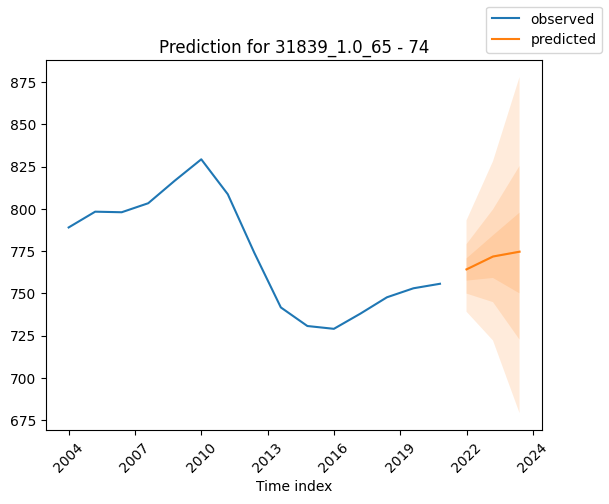

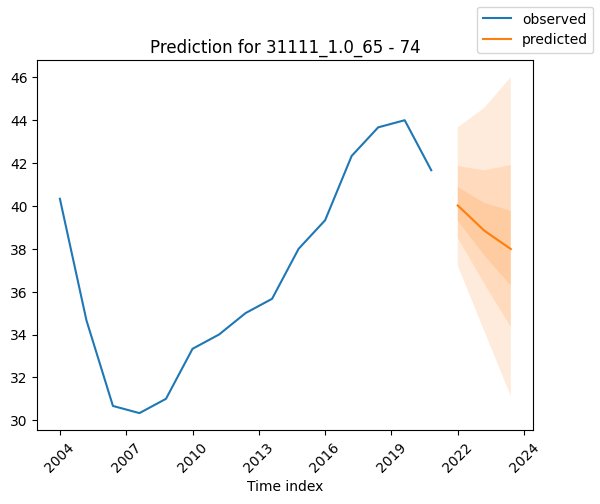

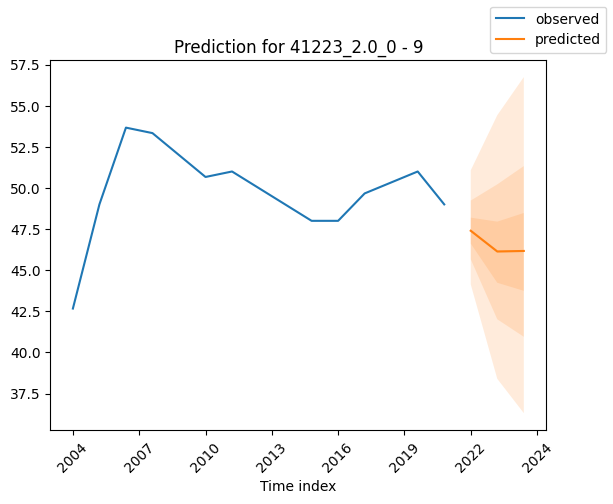

In [ ]:
for idx in random.sample(range(33840), 3):
    fig = best_tft.plot_prediction(
        new_raw_predictions.x,
        new_raw_predictions.output,
        idx=idx,
        show_future_observed=False,
        plot_attention=False,
    )

    actual_index = new_raw_predictions.index["index"][idx]
    
    # Get the axes from the figure and set the title
    ax = fig.axes[0]
    ax.set_title(f"Prediction for {actual_index}")

    # Set x-ticks and labels for years 2004 to 2024
    years = list(range(2004, 2025))
    ax.set_xticks([-15., -12.5, -10., -7.5, -5., -2.5, 0., 2.5])
    ax.set_xticklabels([2004, 2007, 2010, 2013, 2016, 2019, 2022, 2024], rotation=45)



In [52]:
pred = new_raw_predictions.output.prediction  # shape: [33840, 3, 7]

# Select the 4th element along the third dimension (index 3)
selected = pred[:, :, 3]  # shape: [33840, 3]

# Convert to DataFrame
df = pd.DataFrame(selected.detach().cpu().numpy(), columns=["2022", "2023", "2024"])

In [66]:
from pytorch_forecasting.metrics import QuantileLoss

QuantileLoss(quantiles=[0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99])

QuantileLoss(quantiles=[0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99])

In [96]:
new_raw_predictions.index["index"]

0          10101_1.0_0 - 9
1        10101_1.0_10 - 19
2        10101_1.0_20 - 29
3        10101_1.0_30 - 44
4        10101_1.0_45 - 54
               ...        
33835    92301_2.0_30 - 44
33836    92301_2.0_45 - 54
33837    92301_2.0_55 - 64
33838    92301_2.0_65 - 74
33839        92301_2.0_75+
Name: index, Length: 33840, dtype: object

In [ ]:
import numpy as np
import pandas as pd

arr = new_raw_predictions.output.prediction.detach().cpu().numpy()

# Transpose if needed: ensure shape is (samples, steps, quantiles)
#if arr.shape[2] == 3:  # then it's (samples, quantiles, steps)
#    arr = arr.transpose(0, 2, 1)

n_samples, n_steps, n_quantiles = arr.shape  # (33840, 3, 7) if 3 years, 7 quantiles
# Repeat each sample index
original_index = np.repeat(new_raw_predictions.index["index"], n_quantiles * n_steps)

# Repeat quantiles and years
quantiles = ["0.01", "0.1", "0.25", "0.5", "0.75", "0.9", "0.99"]
quantile_column = np.tile(np.repeat(quantiles, n_steps), n_samples)
year_column = np.tile(list(range(2022, 2022 + n_steps)), n_samples * n_quantiles)

# Flatten prediction
prediction_column = arr.flatten()

# Build DataFrame
df_long = pd.DataFrame({
    "original_index": original_index,
    "quantile": quantile_column,
    "year": year_column,
    "prediction": prediction_column
})


(33840, 3, 7)
710640 710640 710640


In [114]:
df_long.head()

,original_index,quantile,year,prediction
0,10101_1.0_0 - 9,0.01,2022,738.573914
0,10101_1.0_0 - 9,0.01,2023,749.024292
0,10101_1.0_0 - 9,0.01,2024,752.340088
0,10101_1.0_0 - 9,0.1,2022,756.720459
0,10101_1.0_0 - 9,0.1,2023,762.561462
